# Spatio-temporal clustering

In [435]:
# le classique imports
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
import geopandas
import geoplot
from shapely.geometry import Polygon, Point
import numpy as np
from scipy import stats
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
import geoplot.crs as gcrs
import matplotlib as mpl
import matplotlib.colors as colors
import random
from tqdm import tqdm

pd.set_option('mode.chained_assignment', None)

# Definitions
## Paths and variables

In [2]:
path = 'C:/Users/Zaca/Documents/Datasets/nyc/'

## Plotting functions

In [573]:
def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=100, reverse=False):
   
    if reverse:
        new_cmap = colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(maxval, minval, n))) 
        
        arr = np.linspace(0, 50, 100).reshape((10, 10))
        fig, ax = plt.subplots(ncols=2)
        ax[0].imshow(arr, interpolation='nearest', cmap=cmap)
        ax[1].imshow(arr, interpolation='nearest', cmap=new_cmap)
        plt.show()
                
        return new_cmap
   
    else:
        new_cmap = colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
        
        arr = np.linspace(0, 50, 100).reshape((10, 10))
        fig, ax = plt.subplots(ncols=2)
        ax[0].imshow(arr, interpolation='nearest', cmap=cmap)
        ax[1].imshow(arr, interpolation='nearest', cmap=new_cmap)
        plt.show()
        
        return new_cmap
    
def default_plot(ax, spines): 
    
    ax = plt.gca()
    # Remove unnecessary axes and ticks (top and bottom)
    ax.spines["top"].set_visible(False)   
    ax.spines["right"].set_visible(False)
    ax.get_xaxis().tick_bottom()  
    ax.get_yaxis().tick_left()
    
    # Set the ticks facing OUTWARD
    ax.get_yaxis().set_tick_params(direction='out')
    ax.get_xaxis().set_tick_params(direction='out')
    
    # Remove grid
    #ax.grid('off')
    
    for loc, spine in ax.spines.items():
        if loc in spines:
            spine.set_position(('outward', 10))  # outward by 10 points

    # turn off ticks where there is no spine
    if 'left' in spines:
        ax.yaxis.set_ticks_position('left')
        
    if 'right' in spines:
        ax.yaxis.set_ticks_position('right')

    if 'bottom' in spines:
        ax.xaxis.set_ticks_position('bottom')

    return ax
    
def get_colors(cmap, n):
    cmap = mpl.cm.get_cmap(cmap)
    rgba = [cmap(x) for x in np.linspace(0.01, 0.99, n)]
    sns.palplot(sns.color_palette(rgba));    
    return rgba

def get_single_color(cmap, n):
    cmap = mpl.cm.get_cmap(cmap)
    rgba = cmap(n)
    return rgba

def precinct_selected(precinct, basemap):  
    basemap['selected'] = np.where(basemap.precinct == precinct, 1, 0)   
    ax = geoplot.choropleth(basemap, hue='selected', figsize=(8, 8), lw= 1, edgecolor='k', alpha=1, cmap=new_cmap, projection=gcrs.AlbersEqualArea())
    #geoplot.polyplot(basemap[basemap.precinct == precinct], lw=1, facecolor= get_single_color(new_cmap, .99), edgecolor='k', alpha=1)
    ax.set_title(str(precinct))
    
def view_clusters(basemap, labeled_data):
    ax = geoplot.polyplot(basemap[basemap.precinct == labeled_data.precinct.values[0]], figsize=(8, 8), lw= 2, facecolor= 'None', edgecolor='k', alpha=1)  
    for i in range(len(labeled_data.labels.unique())):
        ax.scatter(labeled_data[labeled_data.labels == i]['longitude'], labeled_data[labeled_data.labels == i]['latitude'], color=cluster_colors[i], alpha=.75, s=100)
        
def temporal_distribution(labeled_data):   
    fig, ax = plt.subplots(figsize=(6,4))
    ax = default_plot(ax, ['left', 'bottom'])
    plt.xlabel('Time of Day')
    plt.ylabel('Density')
    plt.xlim(0, 24)
    
    min_time = []
    max_time = []
    
    for i in range(len(labeled_data.labels.unique())):
        sns.kdeplot(labeled_data[labeled_data.labels == i].time, bw=1.25, color=cluster_colors[i], label=str(i+1), lw=3)
        
        #min_calc = int(np.median(labeled_data[labeled_data.labels == i].time)) - 4
        #max_calc = int(np.median(labeled_data[labeled_data.labels == i].time)) + 4
        min_calc = stats.mode(labeled_data[labeled_data.labels == i].time)[0][0] - 4
        max_calc = stats.mode(labeled_data[labeled_data.labels == i].time)[0][0] + 4
        
        if min_calc < 0:
            min_calc = 24 + min_calc
        
        if max_calc > 24:
            max_calc = max_calc - 24
            
        min_time += [min_calc]
        max_time += [max_calc]
        
        print('Cluster ' + str(i) + ' schedule:', min_calc, max_calc)
    
    return list(zip(min_time, max_time))

mpl.rcParams['font.family'] = "sans-serif"
mpl.rcParams['font.sans-serif'] = "Arial"   
mpl.rcParams['font.size'] = 13
mpl.rcParams['axes.linewidth'] = 0.5
mpl.rcParams['xtick.major.width'] = 0.5
mpl.rcParams['ytick.major.width'] = 0.5   

## Algorithm functions

In [548]:
def random_points_within(poly, num_points):
  
    # get exterior limits of the polygon
    min_x, min_y, max_x, max_y = poly.bounds

    points = []
    
    # loop until n points is reached
    while len(points) < num_points:
        random_point = Point([random.uniform(min_x, max_x), random.uniform(min_y, max_y)])
        
        # if point inside polygon
        if (random_point.within(poly)):
            points.append(random_point)

    return points

def random_clusters(basemap, precinct, size):
    rps = random_points_within(basemap[basemap.precinct == precinct]['geometry'].unary_union, size)
    longs = [p.x for p in rps]
    lats = [p.y for p in rps]
    times = np.random.randint(0, 24, size)
    training = pd.DataFrame({'latitude':lats, 'longitude':longs, 'time':times, 'precinct':[precinct]*size})
    return training

def make_contour(longitude, latitude, precinct_polygon, colors, levels):
    
    x = longitude
    y = latitude
    
    # check bounds
    xmin = precinct_polygon.bounds['minx'].values - 0.0025
    xmax = precinct_polygon.bounds['maxx'].values + 0.0025
    ymin = precinct_polygon.bounds['miny'].values - 0.0025
    ymax = precinct_polygon.bounds['maxy'].values + 0.0025
    
    # Create meshgrid
    xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
    
    positions = np.vstack([xx.ravel(), yy.ravel()])
    values = np.vstack([x, y])
    kernel = stats.gaussian_kde(values)
    f = np.reshape(kernel(positions).T, xx.shape)
    cset = ax.contour(xx, yy, f, colors=colors, levels=levels, linewidths=1.5)
    
    return cset


def get_level(contour, n):
    
    # the n gives you the level
    # just remember that its backwards
    # the outermost level is 0
    
    x = []
    y = []
    for j in range(len(contour.allsegs)):
        for ii, seg in enumerate(contour.allsegs[j]):
            x += [seg[:,0]]
            y += [seg[:,1]]
    
    return list(zip(x[n], y[n]))  


def get_view_contours(basemap, labeled_data, precinct, levels):
    
    fig, ax = plt.subplots()
    plt.ylabel('Latitude')
    plt.xlabel('Longitude')
    contours = []
    for i in range(len(labeled_data.labels.unique())):
        ctr = make_contour(labeled_data[labeled_data.labels == i]['longitude'], labeled_data[labeled_data.labels == i]['latitude'], basemap[basemap.precinct == labeled_data.precinct.values[0]]['geometry'], colors=cluster_colors[i], levels=levels)
        contours += [ctr]

    levels = [get_level(x, 0) for x in contours]

    ax = geoplot.polyplot(basemap[basemap.precinct == labeled_data.precinct.values[0]], figsize=(8, 8), lw= 2, facecolor= 'None', edgecolor='k', alpha=1)
    for i in range(len(labeled_data.labels.unique())):
        ax.scatter(labeled_data[labeled_data.labels == i]['longitude'], labeled_data[labeled_data.labels == i]['latitude'], color=cluster_colors[i], alpha=.5, s=100)
        ax.plot([x[0] for x in levels[i]], [x[1] for x in levels[i]], color=cluster_colors[i], lw=3)
        
    return levels


def make_clusters(data, n):
    data = data[['latitude', 'longitude', 'time']]
    data['time'] = data['time']
    stdscaler = StandardScaler()
    features = stdscaler.fit_transform(data)
    cluster = KMeans(n)
    #cluster = AgglomerativeClustering(n)
    model = cluster.fit(features)
    
    # re-label so that cluster 0 is always the largest and so on.
    data['labels'] = model.labels_
    re_labeling = data.labels.value_counts().reset_index()['index']
    data['new_labels'] = data['labels'].replace(list(re_labeling.values), list(re_labeling.index))
    
    print('Cluster sizes:')
    print(data.new_labels.value_counts())
    
    return data.new_labels.values


def main(ds, training_period, precinct, n_clusters, testing_period, n_levels=3):
    
    subselection = ds[(ds.date > training_period[0]) & (ds.date < training_period[1]) & (ds.precinct == precinct)]
    subselection['labels'] = make_clusters(subselection, n_clusters)
    precinct_selected(precinct, clean_map)
    view_clusters(clean_map, subselection)
    time_windows = temporal_distribution(subselection)
    contours = get_view_contours(clean_map, subselection, precinct=precinct, levels=n_levels)
    
    zones = [Polygon(x) for x in contours]
    start_time = [x[0] for x in time_windows]
    end_time = [x[1] for x in time_windows]
    
    test_selection = ds[(ds.date > testing_period[0]) & (ds.date < testing_period[1]) & (ds.precinct == precinct)][['latitude', 'longitude', 'time']].reset_index(drop=True)
    test_points = [Point(x, y) for x, y in list(zip(test_selection.longitude, test_selection.latitude))]
    test_times = list(test_selection.time.values)
    
    landed = 0
    for c in range(n_clusters):
        for t in range(len(test_points)):
            if (test_points[t].within(zones[c])) and (start_time[c] < test_times[t] <= end_time[c]):
                landed += 1
    
    print('Target crimes:', len(test_points))            
    if len(test_points) > 0:         
        score = landed/len(test_points)
        if score > 1:
            score = 1
    else:
        score = -1
    print('Precinct:', precinct)
    print('Events located:', score*100)
    
    return score*100, landed, len(test_points)


def random_main(ds, training_period, precinct, n_clusters, testing_period, n_levels=3):
    
    subselection = ds[(ds.date > training_period[0]) & (ds.date < training_period[1]) & (ds.precinct == precinct)]
    simulated = random_clusters(clean_map, precinct, size=subselection.shape[0])
    simulated['labels'] = make_clusters(simulated, n_clusters)
    precinct_selected(precinct, clean_map)
    view_clusters(clean_map, simulated)
    time_windows = temporal_distribution(simulated)
    contours = get_view_contours(clean_map, simulated, precinct=precinct, levels=n_levels)
    
    zones = [Polygon(x) for x in contours]
    start_time = [x[0] for x in time_windows]
    end_time = [x[1] for x in time_windows]
    
    test_selection = ds[(ds.date > testing_period[0]) & (ds.date < testing_period[1]) & (ds.precinct == precinct)][['latitude', 'longitude', 'time']].reset_index(drop=True)
    test_points = [Point(x, y) for x, y in list(zip(test_selection.longitude, test_selection.latitude))]
    test_times = list(test_selection.time.values)
    
    landed = 0
    for c in range(n_clusters):
        for t in range(len(test_points)):
            if (test_points[t].within(zones[c])) and (start_time[c] < test_times[t] <= end_time[c]):
                landed += 1
    
    print('Target crimes:', len(test_points))            
    
    if len(test_points) > 0:         
        score = landed/len(test_points)
        
        if score > 1:
            score = 1
    else:
        score = -1
    
    print('Precinct:', precinct)
    print('Events located:', score*100)
    
    return score*100, landed, len(test_points)

# Choosing colors

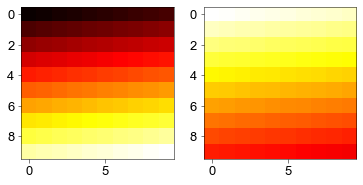

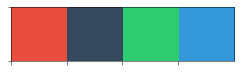

In [5]:
cmap = plt.get_cmap('hot')
new_cmap = truncate_colormap(cmap, 0.35, 1, reverse=True)

#cluster_colors = get_colors(cmap='cool_r', n=4)
#cluster_colors = ["#95a5a6", "#e74c3c", "#34495e", "#2ecc71"]
cluster_colors = ["#e74c3c", "#34495e", "#2ecc71", "#3498db"]
sns.palplot(sns.color_palette(cluster_colors));

# Preparing base maps

In [550]:
# open shapefile
pcints = geopandas.read_file(path + 'nypd_precincts.shp').to_crs(epsg=4326)

# clean a variable dtypes
pcints['pct'] = pcints['pct'].astype('int32')

# create a new, clean GeoDataFrame
clean_map = geopandas.GeoDataFrame()
clean_map['precinct'] = pcints['pct'].unique()
clean_map['geometry'] = [Polygon(max(pcints.loc[pcints['pct'] == pct, 'geometry'].unary_union, key=lambda a: a.area).exterior) if pcints.loc[pcints['pct'] == pct, 'geometry'].unary_union.geom_type == 'MultiPolygon' else Polygon(pcints.loc[pcints['pct'] == pct, 'geometry'].unary_union.exterior) for pct in clean_map.precinct]

# Read pre-processed data

In [551]:
# open data
crime = pd.read_csv(path + 'nypd_historic_07-18.csv', index_col=0)
# transform to datetime
crime['date'] = pd.to_datetime(crime['date'])

C:\Users\Zaca\Anaconda3\lib\site-packages\numpy\lib\arraysetops.py:569: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


# Filter by crime

In [552]:
violent = ['FELONY ASSAULT', 'ROBBERY']
propert = ['BURGLARY', 'ARSON', 'GRAND LARCENY', 'GRAND LARCENY OF MOTOR VEHICLE']
popular_sites = ['RESID', 'STREET']
crime_filter = violent + propert
crime_subset = crime[crime.description.isin(crime_filter)]

In [553]:
#crime_subset[crime_subset.description == 'BURGLARY'].premises.value_counts()[:30]

# Select crime type

In [554]:
ds = crime_subset[(crime_subset.description == propert[0]) & (crime_subset.premises.str.contains(popular_sites[0]))]

# look at number of crime per precinct for exploration
highest_ = ds.groupby('precinct').agg(count=('date', 'count')).sort_values(by='count', ascending=False)

# Select algorithm parameters

In [603]:
precinct = 75
training_period = ['2015-01-01', '2017-01-01']
testing_period = ['2017-01-01', '2017-03-01']
n_clusters = 4
n_levels = 4 # how restrictive are the clusters

training = ds[(ds.date > training_period[0]) & (ds.date < training_period[1]) & (ds.precinct == precinct)]
test = ds[(ds.date > testing_period[0]) & (ds.date < testing_period[1]) & (ds.precinct == precinct)][['latitude', 'longitude', 'time']].reset_index(drop=True)
test_points = [Point(x, y) for x, y in list(zip(test.longitude, test.latitude))]
test_times = list(test.time.values)

# Debugging section

Cluster sizes:
0    81
1    77
2    74
3    57
Name: new_labels, dtype: int64
Cluster 3 schedule: 3 11
Precinct: 75
# Target crimes: 42
Events located: 57.14285714285714


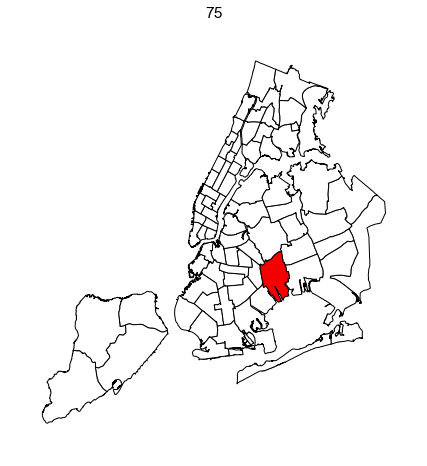

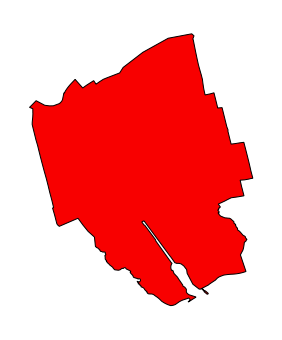

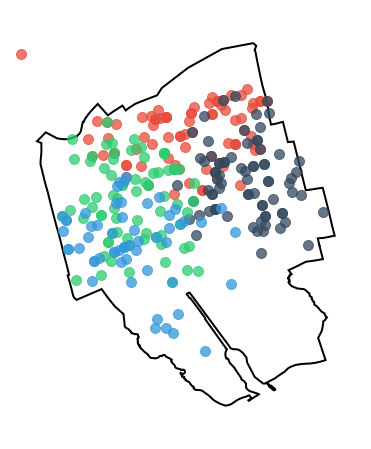

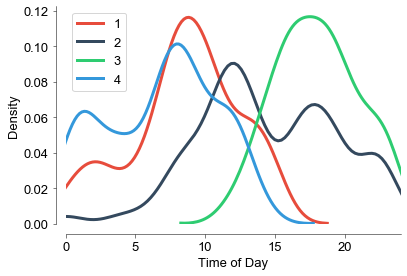

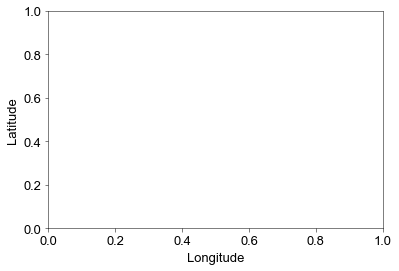

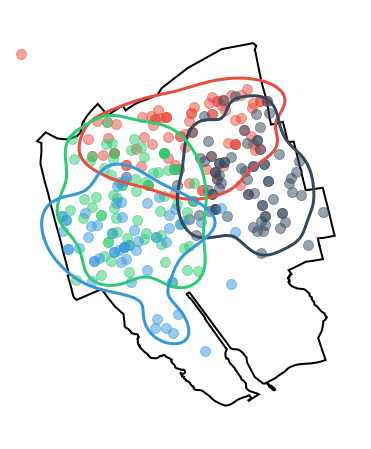

In [568]:
training = ds[(ds.date > training_period[0]) & (ds.date < training_period[1]) & (ds.precinct == precinct)]
# define and select clustering algorithm
training['labels'] = make_clusters(training, n_clusters)

# showing selected area
precinct_selected(precinct, clean_map)

# view clusters identified by training
view_clusters(clean_map, training)

# temporal distribution of clusters
time_windows = temporal_distribution(training)

# estimate kernel density and grab contours
contours = get_view_contours(clean_map, training, precinct, levels=n_levels)

# define clusters
zones = [Polygon(x) for x in contours]
start_time = [x[0] for x in time_windows]
end_time = [x[1] for x in time_windows]

cluster_hours = [list(range(x, x+8)) for x in start_time]
cluster_hours_fixed = []
for i in cluster_hours:
    cluster_hours_fixed += [[x - 24 if x > 23 else x for x in i]]

landed = 0
for c in range(n_clusters):
    for t in range(len(test_points)):
        if (test_points[t].within(zones[c])) and (test_times[t] in cluster_hours_fixed[c]):
            landed += 1
                
if len(test_points) > 0:         
    score = landed/len(test_points)
    if score > 1:
        score = 1
else:
    score = -1

print('Precinct:', precinct)
print('# Target crimes:', len(test_points))
print('Events located:', score*100)

# For every precinct

In [569]:
# get list of precincts
precincts = list(highest_.index[:42])

Cluster sizes:
0    172
1    161
2    148
3    140
Name: new_labels, dtype: int64
Cluster 0 schedule: 4 12
Cluster 1 schedule: 14 22
Cluster 2 schedule: 8 16
Cluster 3 schedule: 4 12
Target crimes: 23
Precinct: 75
Events located: 56.52173913043478
Cluster sizes:
0    273
1    150
2    128
3     79
Name: new_labels, dtype: int64
Cluster 0 schedule: 5 13
Cluster 1 schedule: 10 18
Cluster 2 schedule: 13 21
Cluster 3 schedule: 5 13
Target crimes: 29
Precinct: 83
Events located: 86.20689655172413
Cluster sizes:
0    187
1    143
2    141
3     91
Name: new_labels, dtype: int64
Cluster 0 schedule: 14 22
Cluster 1 schedule: 3 11
Cluster 2 schedule: 8 16
Cluster 3 schedule: 8 16
Target crimes: 16
Precinct: 105
Events located: 75.0
Cluster sizes:
0    144
1    131
2    128
3     51
Name: new_labels, dtype: int64
Cluster 0 schedule: 14 22
Cluster 1 schedule: 4 12
Cluster 2 schedule: 6 14
Cluster 3 schedule: 8 16
Target crimes: 10
Precinct: 109
Events located: 60.0
Cluster sizes:
0    132
1    12

C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 11 19
Cluster 1 schedule: 3 11
Cluster 2 schedule: 3 11
Cluster 3 schedule: 16 24


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 10
Precinct: 52
Events located: 60.0
Cluster sizes:
0    136
1    106
2    105
3     67
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 10 18
Cluster 1 schedule: 4 12
Cluster 2 schedule: 7 15
Cluster 3 schedule: 12 20


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 11
Precinct: 67
Events located: 54.54545454545454
Cluster sizes:
1    95
0    95
2    91
3    83
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 4 12
Cluster 1 schedule: 6 14
Cluster 2 schedule: 15 23
Cluster 3 schedule: 11 19


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 7
Precinct: 113
Events located: 0.0
Cluster sizes:
0    110
1     94
2     78
3     75
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 4 12
Cluster 1 schedule: 14 22
Cluster 2 schedule: 4 12
Cluster 3 schedule: 21 5


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 12
Precinct: 114
Events located: 58.333333333333336
Cluster sizes:
0    128
1    127
2    126
3     94
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 6 14
Cluster 1 schedule: 15 23
Cluster 2 schedule: 8 16
Cluster 3 schedule: 13 21


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 20
Precinct: 47
Events located: 75.0
Cluster sizes:
0    126
1    120
2    113
3    106
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 9 17
Cluster 1 schedule: 10 18
Cluster 2 schedule: 3 11
Cluster 3 schedule: 4 12


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 12
Precinct: 43
Events located: 75.0
Cluster sizes:
0    130
1    119
2     91
3     66
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 7 15
Cluster 1 schedule: 10 18
Cluster 2 schedule: 7 15
Cluster 3 schedule: 11 19


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 18
Precinct: 104
Events located: 100
Cluster sizes:
0    118
1     94
2     75
3     69
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 3 11
Cluster 1 schedule: 7 15
Cluster 2 schedule: 10 18
Cluster 3 schedule: 8 16


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 20
Precinct: 115
Events located: 75.0
Cluster sizes:
0    113
1     88
2     66
3     49
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 14 22
Cluster 1 schedule: 20 4
Cluster 2 schedule: 4 12
Cluster 3 schedule: 10 18


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 8
Precinct: 70
Events located: 75.0
Cluster sizes:
0    117
1    111
2     94
3     73
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 13 21
Cluster 1 schedule: 10 18
Cluster 2 schedule: 5 13
Cluster 3 schedule: 20 4


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 20
Precinct: 79
Events located: 35.0
Cluster sizes:
0    108
1    102
2     94
3     83
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 6 14
Cluster 1 schedule: 20 4
Cluster 2 schedule: 3 11
Cluster 3 schedule: 12 20


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 13
Precinct: 61
Events located: 61.53846153846154
Cluster sizes:
0    91
1    89
2    83
3    75
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 2 10
Cluster 1 schedule: 9 17
Cluster 2 schedule: 15 23
Cluster 3 schedule: 14 22


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 12
Precinct: 110
Events located: 50.0
Cluster sizes:
0    119
1     82
2     80
3     77
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 10 18
Cluster 1 schedule: 4 12
Cluster 2 schedule: 5 13
Cluster 3 schedule: 5 13


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 8
Precinct: 90
Events located: 25.0
Cluster sizes:
0    72
1    71
2    69
3    60
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 10 18
Cluster 1 schedule: 7 15
Cluster 2 schedule: 12 20
Cluster 3 schedule: 9 17


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 5
Precinct: 102
Events located: 80.0
Cluster sizes:
0    125
1     99
2     83
3     55
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 14 22
Cluster 1 schedule: 12 20
Cluster 2 schedule: 4 12
Cluster 3 schedule: 1 9


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 15
Precinct: 81
Events located: 66.66666666666666
Cluster sizes:
0    80
1    63
2    55
3    51
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 9 17
Cluster 1 schedule: 4 12
Cluster 2 schedule: 19 3
Cluster 3 schedule: 0 8


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 14
Precinct: 49
Events located: 42.857142857142854
Cluster sizes:
0    78
1    72
2    70
3    68
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 4 12
Cluster 1 schedule: 13 21
Cluster 2 schedule: 3 11
Cluster 3 schedule: 14 22


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 18
Precinct: 77
Events located: 72.22222222222221
Cluster sizes:
0    95
1    81
2    60
3    57
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 8 16
Cluster 1 schedule: 4 12
Cluster 2 schedule: 16 24
Cluster 3 schedule: 8 16


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 10
Precinct: 62
Events located: 80.0
Cluster sizes:
0    109
1     72
2     62
3     51
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 5 13
Cluster 1 schedule: 5 13
Cluster 2 schedule: 13 21
Cluster 3 schedule: 6 14


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 10
Precinct: 66
Events located: 70.0
Cluster sizes:
0    107
1     99
2     90
3     61
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 13 21
Cluster 1 schedule: 4 12
Cluster 2 schedule: 3 11
Cluster 3 schedule: 18 2


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 11
Precinct: 44
Events located: 27.27272727272727
Cluster sizes:
0    89
1    80
2    53
3    32
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 8 16
Cluster 1 schedule: 19 3
Cluster 2 schedule: 7 15
Cluster 3 schedule: 16 24


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 20
Precinct: 106
Events located: 60.0
Cluster sizes:
0    83
1    66
2    56
3    55
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 7 15
Cluster 1 schedule: 19 3
Cluster 2 schedule: 6 14
Cluster 3 schedule: 4 12


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 18
Precinct: 107
Events located: 33.33333333333333
Cluster sizes:
0    63
1    58
3    55
2    55
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 11 19
Cluster 1 schedule: 12 20
Cluster 2 schedule: 20 4
Cluster 3 schedule: 4 12


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 4
Precinct: 120
Events located: 25.0
Cluster sizes:
0    73
1    67
2    65
3    64
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 13 21
Cluster 1 schedule: 12 20
Cluster 2 schedule: 6 14
Cluster 3 schedule: 4 12


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 9
Precinct: 73
Events located: 55.55555555555556
Cluster sizes:
0    93
1    86
2    74
3    71
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 6 14
Cluster 1 schedule: 21 5
Cluster 2 schedule: 16 24
Cluster 3 schedule: 8 16


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 10
Precinct: 103
Events located: 10.0
Cluster sizes:
0    95
1    83
2    61
3    55
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 4 12
Cluster 1 schedule: 14 22
Cluster 2 schedule: 8 16
Cluster 3 schedule: 14 22


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 11
Precinct: 111
Events located: 100.0
Cluster sizes:
0    115
1     99
2     77
3     70
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 10 18
Cluster 1 schedule: 6 14
Cluster 2 schedule: 4 12
Cluster 3 schedule: 13 21


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 6
Precinct: 46
Events located: 50.0
Cluster sizes:
0    91
1    76
2    68
3    52
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 12 20
Cluster 1 schedule: 3 11
Cluster 2 schedule: 4 12
Cluster 3 schedule: 10 18


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 11
Precinct: 48
Events located: 63.63636363636363
Cluster sizes:
0    83
1    69
2    61
3    41
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 4 12
Cluster 1 schedule: 15 23
Cluster 2 schedule: 3 11
Cluster 3 schedule: 5 13


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 15
Precinct: 71
Events located: 60.0
Cluster sizes:
0    59
1    57
3    56
2    56
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 4 12
Cluster 1 schedule: 11 19
Cluster 2 schedule: 5 13
Cluster 3 schedule: 16 24


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 15
Precinct: 34
Events located: 86.66666666666667
Cluster sizes:
0    73
1    60
2    50
3    47
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 13 21
Cluster 1 schedule: 3 11
Cluster 2 schedule: 5 13
Cluster 3 schedule: 6 14


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 4
Precinct: 63
Events located: 75.0
Cluster sizes:
0    90
1    75
2    61
3    39
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 4 12
Cluster 1 schedule: 5 13
Cluster 2 schedule: 4 12
Cluster 3 schedule: 11 19


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 6
Precinct: 68
Events located: 66.66666666666666
Cluster sizes:
0    58
1    53
2    34
3    30
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 5 13
Cluster 1 schedule: 3 11
Cluster 2 schedule: 18 2
Cluster 3 schedule: 14 22


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 2
Precinct: 69
Events located: 50.0
Cluster sizes:
0    85
1    43
2    38
3    14
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 4 12
Cluster 1 schedule: 5 13
Cluster 2 schedule: 14 22
Cluster 3 schedule: 6 14


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 7
Precinct: 108
Events located: 71.42857142857143
Cluster sizes:
0    70
1    53
2    41
3    11
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 5 13
Cluster 1 schedule: 5 13
Cluster 2 schedule: 10 18
Cluster 3 schedule: 20 4


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 3
Precinct: 45
Events located: 33.33333333333333
Cluster sizes:
0    57
1    43
2    40
3    38
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 13 21
Cluster 1 schedule: 13 21
Cluster 2 schedule: 5 13
Cluster 3 schedule: 4 12


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 3
Precinct: 122
Events located: 33.33333333333333
Cluster sizes:
0    75
1    71
2    54
3    37
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 9 17
Cluster 1 schedule: 4 12
Cluster 2 schedule: 4 12
Cluster 3 schedule: 8 16


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 6
Precinct: 72
Events located: 66.66666666666666
Cluster sizes:
0    59
1    50
2    40
3    36
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 4 12
Cluster 1 schedule: 17 1
Cluster 2 schedule: 8 16
Cluster 3 schedule: 4 12


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 6
Precinct: 19
Events located: 33.33333333333333


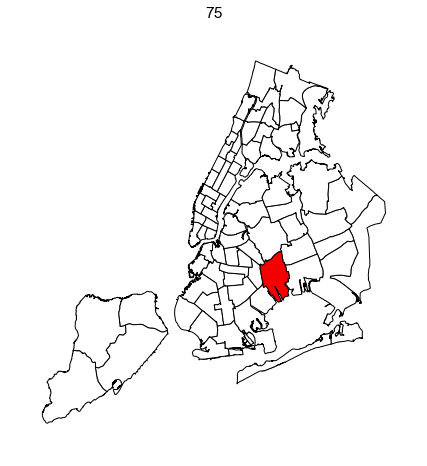

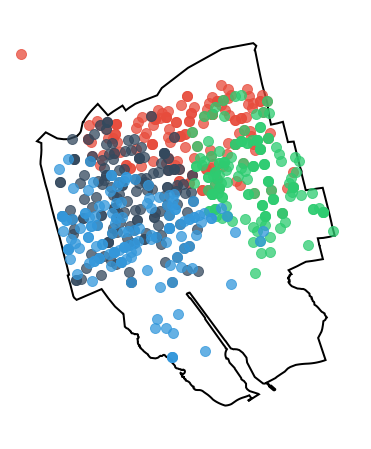

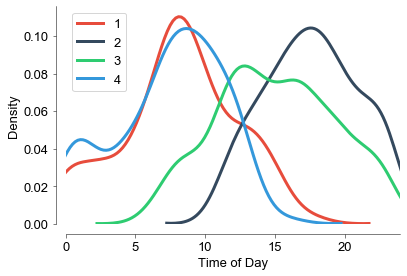

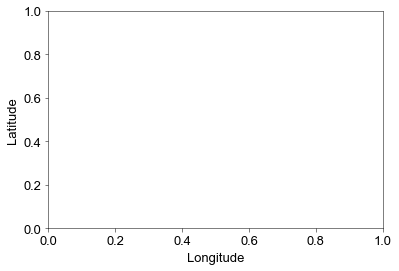

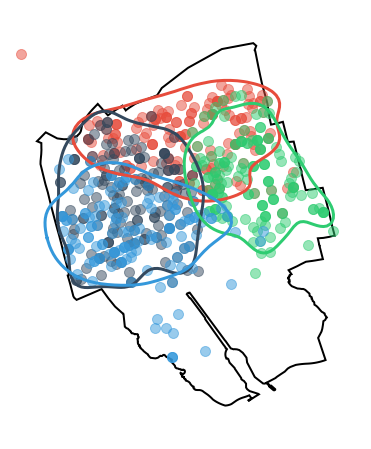

...

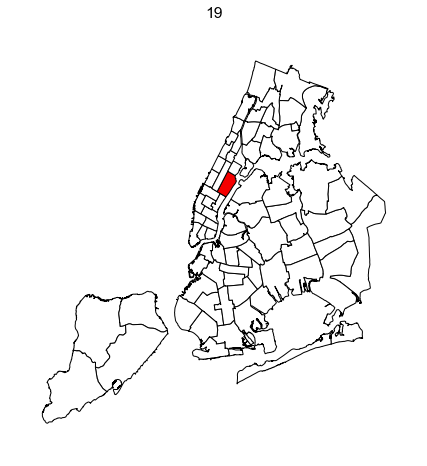

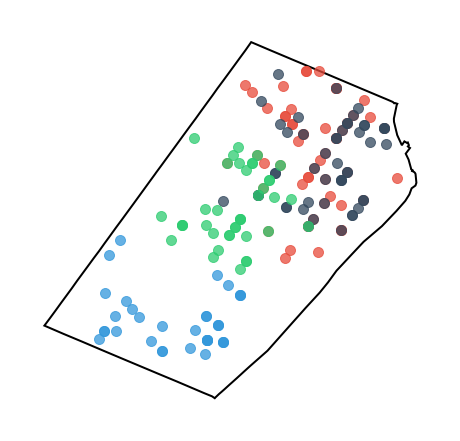

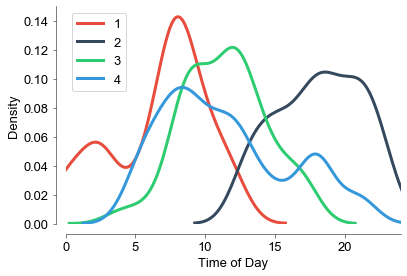

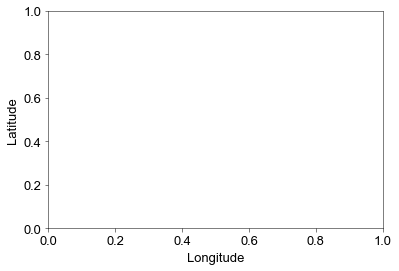

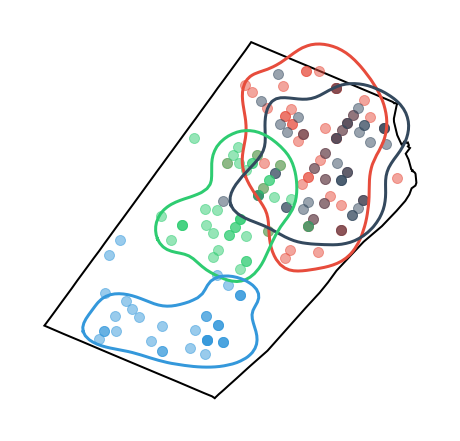

In [574]:
scores = []
for precinct in precincts:
    scores += [main(ds=ds, training_period=training_period, precinct=precinct, n_clusters=n_clusters, testing_period=testing_period, n_levels=n_levels)]

In [475]:
percentage = [x[0] for x in scores]
predicted = [x[1] for x in scores]
observed = [x[2] for x in scores]

print(sum(predicted)/sum(observed))

0.5375565610859728


52.975168173755925


(0, 100)

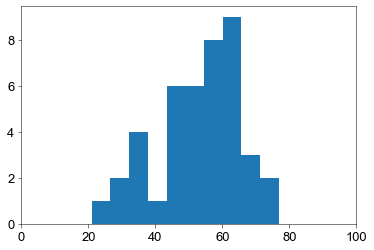

In [476]:
print(np.mean(percentage))
plt.hist(percentage);
plt.xlim(0, 100)

Target crimes: 269
Precinct: 75
Events located: 33.457249070631974
Target crimes: 237
Precinct: 83
Events located: 14.345991561181433
Target crimes: 242
Precinct: 105
Events located: 22.727272727272727
Target crimes: 182
Precinct: 109
Events located: 47.8021978021978
Target crimes: 128
Precinct: 52
Events located: 42.96875
Target crimes: 170
Precinct: 67
Events located: 52.94117647058824
Target crimes: 107
Precinct: 113
Events located: 42.05607476635514
Target crimes: 137
Precinct: 114
Events located: 41.605839416058394
Target crimes: 237
Precinct: 47
Events located: 30.37974683544304
Target crimes: 138
Precinct: 43
Events located: 21.014492753623188


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 197
Precinct: 104
Events located: 32.48730964467005


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 165
Precinct: 115
Events located: 55.15151515151515


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 112
Precinct: 70
Events located: 27.67857142857143


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 154
Precinct: 79
Events located: 24.025974025974026


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 157
Precinct: 61
Events located: 71.97452229299363


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 147
Precinct: 110
Events located: 53.06122448979592


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 132
Precinct: 90
Events located: 41.66666666666667


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 97
Precinct: 102
Events located: 48.45360824742268


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 121
Precinct: 81
Events located: 69.42148760330579


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 134
Precinct: 49
Events located: 23.134328358208954


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 116
Precinct: 77
Events located: 76.72413793103449


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 124
Precinct: 62
Events located: 26.61290322580645


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 84
Precinct: 66
Events located: 59.523809523809526


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 141
Precinct: 44
Events located: 41.13475177304964


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 126
Precinct: 106
Events located: 30.158730158730158


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 140
Precinct: 107
Events located: 52.85714285714286


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 113
Precinct: 120
Events located: 56.63716814159292


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 132
Precinct: 73
Events located: 53.03030303030303


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 116
Precinct: 103
Events located: 16.379310344827587


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 125
Precinct: 111
Events located: 54.400000000000006


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 118
Precinct: 46
Events located: 11.016949152542372


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 124
Precinct: 48
Events located: 58.87096774193549


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 85
Precinct: 71
Events located: 36.470588235294116


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 100
Precinct: 34
Events located: 55.00000000000001


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 76
Precinct: 63
Events located: 80.26315789473685


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 80
Precinct: 68
Events located: 38.75


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 61
Precinct: 69
Events located: 44.26229508196721


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 73
Precinct: 108
Events located: 49.31506849315068


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 86
Precinct: 45
Events located: 6.976744186046512


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 64
Precinct: 122
Events located: 67.1875


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 84
Precinct: 72
Events located: 67.85714285714286


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 94
Precinct: 19
Events located: 23.404255319148938


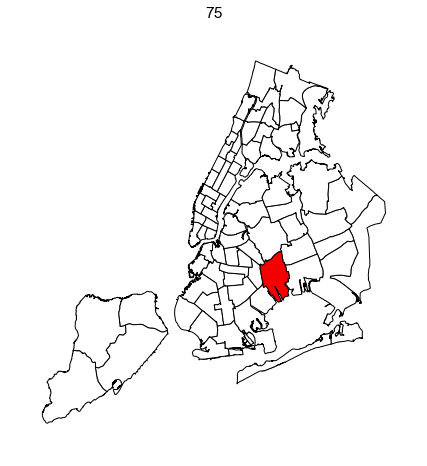

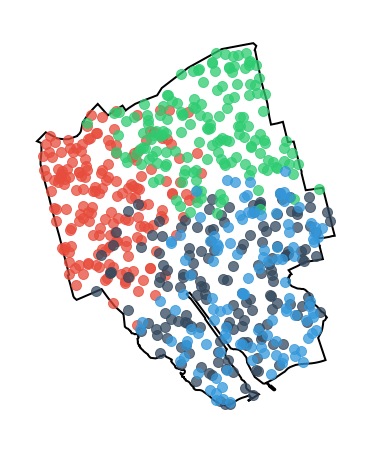

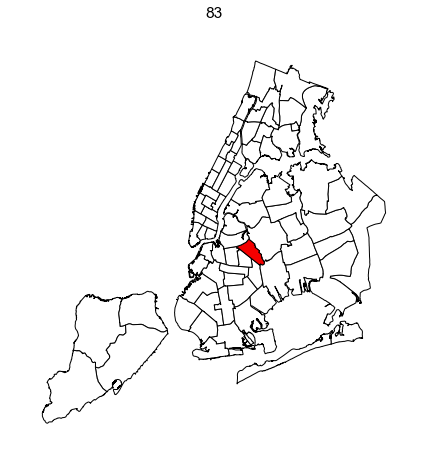

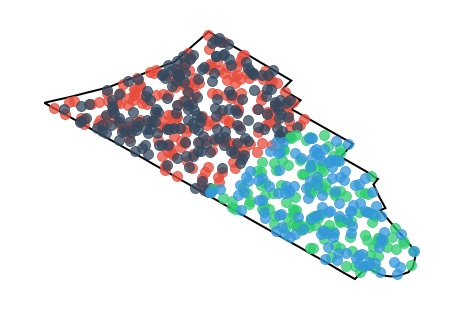

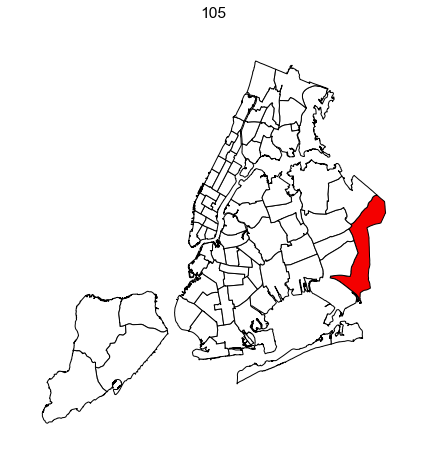

...

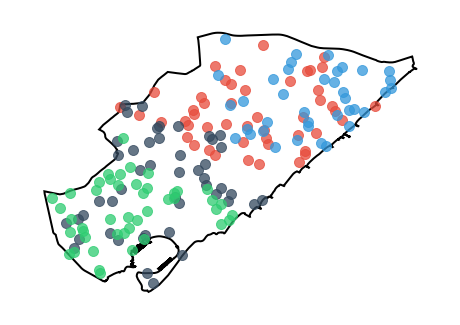

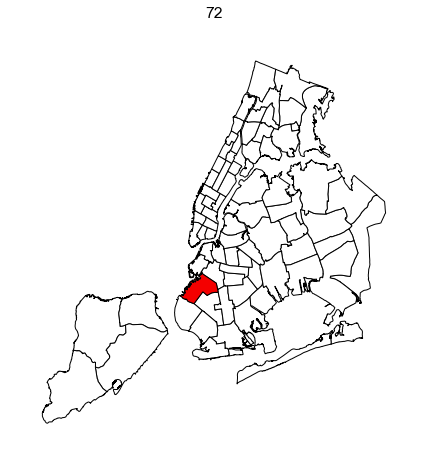

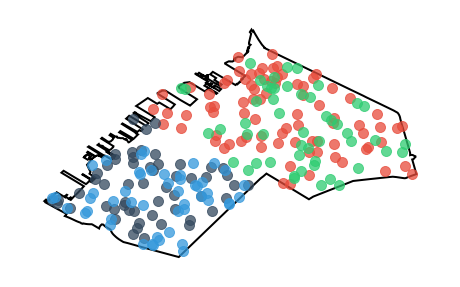

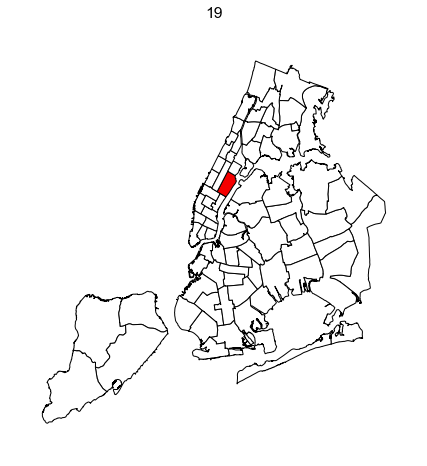

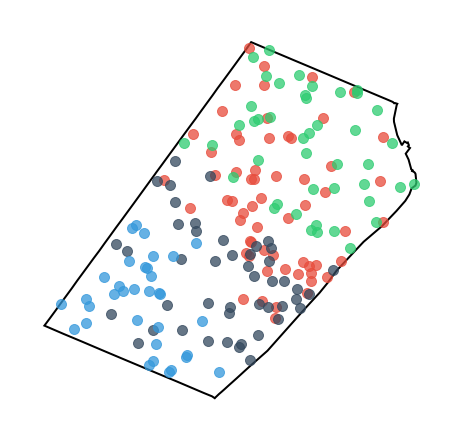

In [477]:
random_scores = []
for precinct in precincts:
    random_scores += [random_main(ds=ds, training_period=training_period, precinct=precinct, n_clusters=n_clusters, testing_period=testing_period, n_levels=n_levels)]

0.4095927601809955
42.51241238317757


(0, 100)

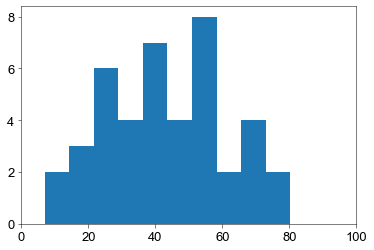

In [478]:
random_percentage = [x[0] for x in random_scores]
random_predicted = [x[1] for x in random_scores]
random_observed = [x[2] for x in random_scores]
print(sum(random_predicted)/sum(random_observed))

print(np.median(random_percentage))
plt.hist(random_percentage);
plt.xlim(0, 100)



# Plot making section

Cluster sizes:
0    108
1    102
2     94
3     83
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:22: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


Cluster 0 schedule: 6 14
Cluster 1 schedule: 20 4
Cluster 2 schedule: 3 11
Cluster 3 schedule: 12 20


[(6, 14), (20, 4), (3, 11), (12, 20)]

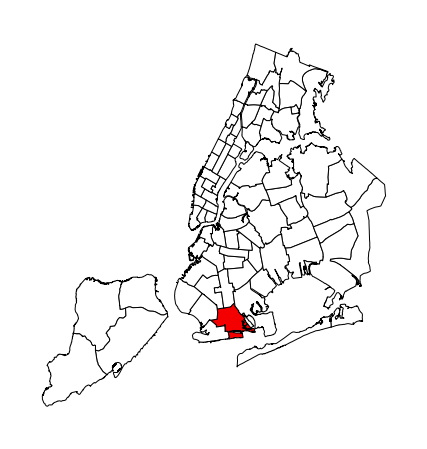

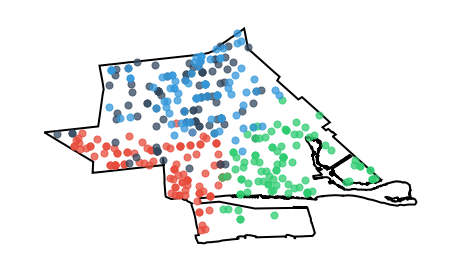

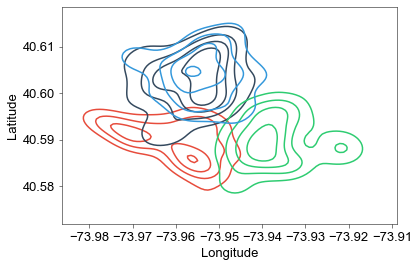

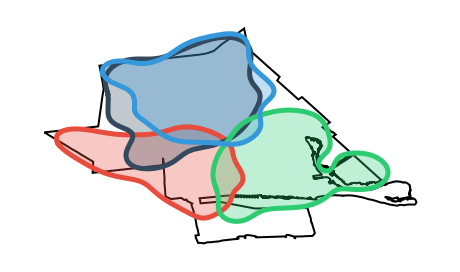

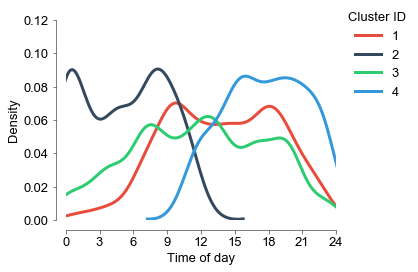

In [614]:
precinct = 61
training_period = ['2015-01-01', '2017-01-01']
testing_period = ['2017-01-01', '2017-02-01']
n_clusters = 4
n_levels = 4 # how restrictive are the clusters

training = ds[(ds.date > training_period[0]) & (ds.date < training_period[1]) & (ds.precinct == precinct)]
test = ds[(ds.date > testing_period[0]) & (ds.date < testing_period[1]) & (ds.precinct == precinct)][['latitude', 'longitude', 'time']].reset_index(drop=True)
test_points = [Point(x, y) for x, y in list(zip(test.longitude, test.latitude))]
test_times = list(test.time.values)

training = ds[(ds.date > training_period[0]) & (ds.date < training_period[1]) & (ds.precinct == precinct)]

# define and select clustering algorithm
training['labels'] = make_clusters(training, n_clusters)

# showing selected area

basemap = clean_map.copy()
basemap['selected'] = np.where(basemap.precinct == precinct, 1, 0)   
ax = geoplot.choropleth(basemap, hue='selected', figsize=(8, 8), lw= 1, edgecolor='k', alpha=1, cmap=new_cmap, projection=gcrs.AlbersEqualArea())
plt.tight_layout()
plt.savefig('figures/precinct.png', dpi=300)

labeled_data = training.copy()
# view clusters identified by training
ax = geoplot.polyplot(basemap[basemap.precinct == labeled_data.precinct.values[0]], figsize=(8, 8), lw= 2, facecolor= 'None', edgecolor='k', alpha=1)  
for i in range(len(labeled_data.labels.unique())):
    ax.scatter(labeled_data[labeled_data.labels == i]['longitude'], labeled_data[labeled_data.labels == i]['latitude'], color=cluster_colors[i], alpha=.75, s=50)
    #ax.scatter(labeled_data[labeled_data.labels == i]['longitude'], labeled_data[labeled_data.labels == i]['latitude'], color='k', alpha=.75, s=65)
#plt.savefig('figures/precinct_115_zoom.png', dpi=300)
plt.savefig('figures/precinct_zoom_clustered.png', dpi=300)

# estimate kernel density and grab contours
fig, ax = plt.subplots()
plt.ylabel('Latitude')
plt.xlabel('Longitude')
contours = []

for i in range(len(labeled_data.labels.unique())):
    ctr = make_contour(labeled_data[labeled_data.labels == i]['longitude'], labeled_data[labeled_data.labels == i]['latitude'], basemap[basemap.precinct == labeled_data.precinct.values[0]]['geometry'], colors=cluster_colors[i], levels=4)
    contours += [ctr]

levels = [get_level(x, 0) for x in contours]

ax = geoplot.polyplot(basemap[basemap.precinct == labeled_data.precinct.values[0]], figsize=(8, 8), lw= 2, facecolor= 'None', edgecolor='k', alpha=1)
for i in range(len(labeled_data.labels.unique())):
    #ax.scatter(labeled_data[labeled_data.labels == i]['longitude'], labeled_data[labeled_data.labels == i]['latitude'], color=cluster_colors[i], alpha=.5, s=50)
    ax.plot([x[0] for x in levels[i]], [x[1] for x in levels[i]], color=cluster_colors[i], lw=5)
    ax.fill_between([x[0] for x in levels[i]], [x[1] for x in levels[i]], facecolor=cluster_colors[i], alpha=.3)
plt.savefig('figures/precinct_zoom_clustered_kde_no_scatter.png', dpi=300)



# temporal distribution of clusters
fig, ax = plt.subplots(figsize=(6,4))
ax = default_plot(ax, ['left', 'bottom'])
plt.xlabel('Time of day')
plt.ylabel('Density')
plt.xlim(0, 24)
plt.xticks(np.arange(0, 27, 3))
plt.ylim(0, 0.12)

    
min_time = []
max_time = []
    
for i in range(len(labeled_data.labels.unique())):
    sns.kdeplot(labeled_data[labeled_data.labels == i].time, bw=1.25, color=cluster_colors[i], label=str(i+1), lw=3)
    
    # calculate mode
    min_calc = stats.mode(labeled_data[labeled_data.labels == i].time)[0][0] - 4
    max_calc = stats.mode(labeled_data[labeled_data.labels == i].time)[0][0] + 4
        
    if min_calc < 0:
        min_calc = 24 + min_calc
        
    if max_calc > 24:
        max_calc = max_calc - 24
            
    min_time += [min_calc]
    max_time += [max_calc]
        
    print('Cluster ' + str(i) + ' schedule:', min_calc, max_calc)

plt.legend(frameon=False, bbox_to_anchor=(1, 1.1), title='Cluster ID') 
plt.tight_layout()
plt.savefig('figures/precinct_cluster_times.png', dpi=300)
    
    
time_windows = list(zip(min_time, max_time))

time_windows

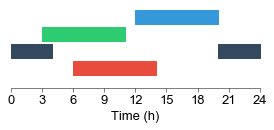

In [615]:
# define clusters
zones = [Polygon(x) for x in levels]
start_time = [x[0] for x in time_windows]
end_time = [x[1] for x in time_windows]

# make schedule plot
fig, ax = plt.subplots(figsize=(4, 2))
ax = default_plot(ax, ['left', 'bottom'])
plt.xlim(0, 24)
ax.spines["left"].set_visible(False)
plt.yticks([])
plt.xticks(np.arange(0, 27, 3))
plt.xlabel('Time (h)')

for i in range(len(start_time)):
    if end_time[i] - start_time[i] < 0:
        plt.fill_between(range(start_time[i], 25), i+1, i+1.8, color=cluster_colors[i])
        plt.fill_between(range(0, end_time[i] + 1), i+1, i+1.8, color=cluster_colors[i])
    plt.fill_between(range(start_time[i], end_time[i] + 1), i+1, i+1.8, color=cluster_colors[i])
    
    
plt.tight_layout()   
plt.savefig('figures/precinct_cluster_schedule.png', dpi=300)

In [616]:
landed = 0
for c in range(n_clusters):
    for t in range(len(test_points)):
        if (test_points[t].within(zones[c])) and (start_time[c] < test_times[t] <= end_time[c]):
            landed += 1
                
if len(test_points) > 0:         
    score = landed/len(test_points)
    if score > 1:
        score = 1
else:
    score = -1

print('Precinct:', precinct)
print('# Target crimes:', len(test_points))
print('Events located:', score*100)

Precinct: 61
# Target crimes: 13
Events located: 61.53846153846154


In [580]:
start_time

[8, 4, 11, 20]

In [385]:
# Make gif

In [609]:
cluster_hours = [list(range(x, x+8)) for x in start_time]
cluster_hours_fixed = []
for i in cluster_hours:
    cluster_hours_fixed += [[x - 24 if x > 23 else x for x in i ]]
cluster_hours_fixed

[[6, 7, 8, 9, 10, 11, 12, 13],
 [20, 21, 22, 23, 0, 1, 2, 3],
 [3, 4, 5, 6, 7, 8, 9, 10],
 [12, 13, 14, 15, 16, 17, 18, 19]]

C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much mem

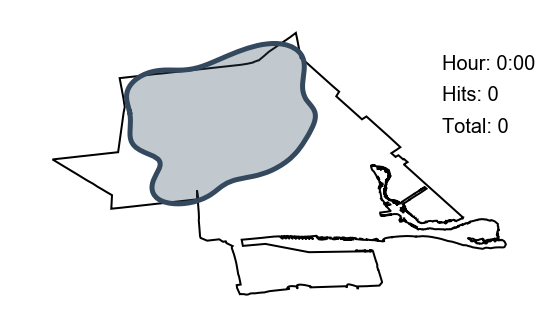

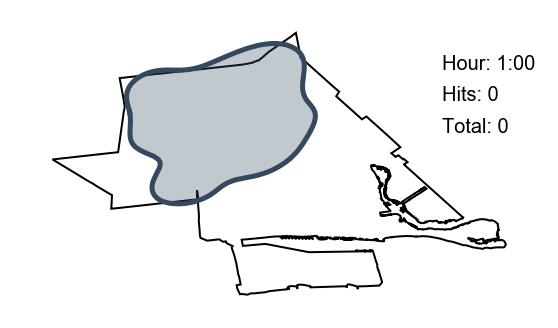

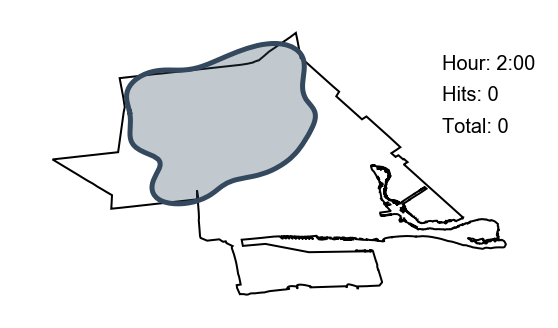

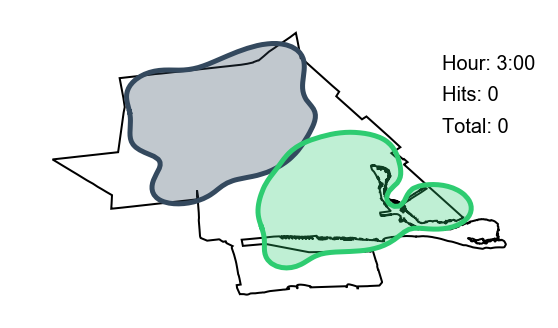

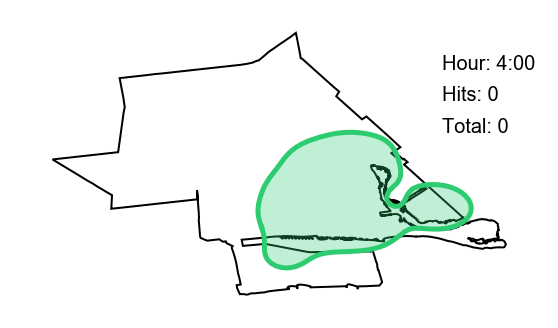

...

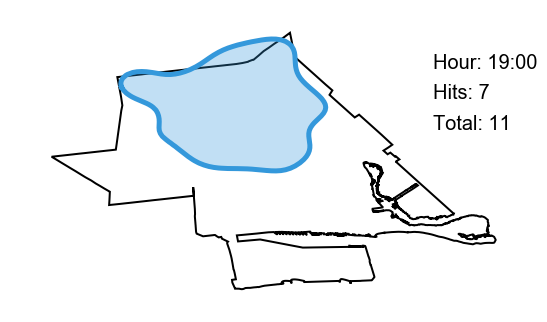

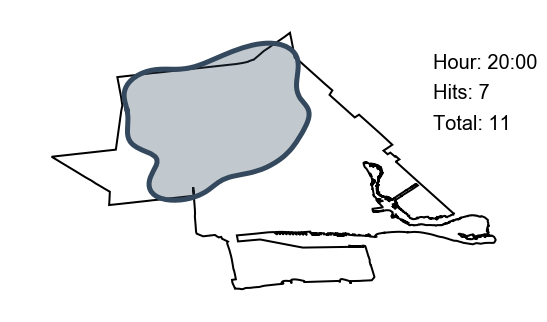

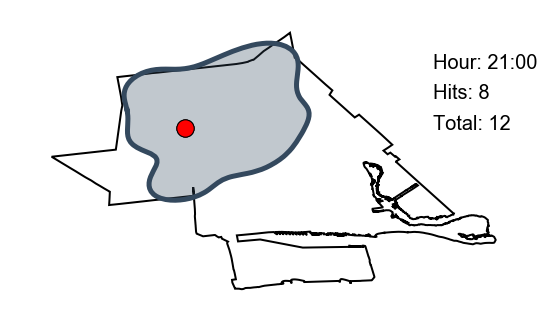

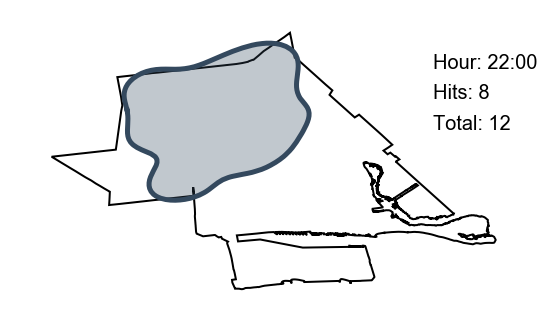

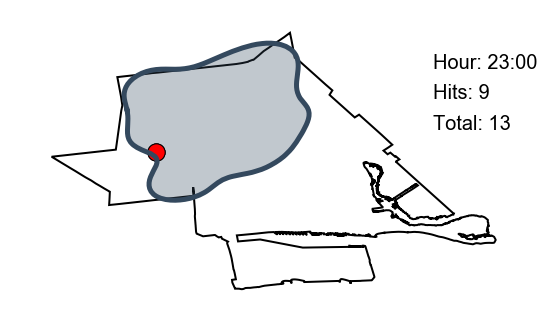

In [619]:
hits = 0
total = 0

for i in range(24):
    
    ax = geoplot.polyplot(basemap[basemap.precinct == labeled_data.precinct.values[0]], figsize=(8, 8), lw= 2, facecolor= 'None', edgecolor='k', alpha=1)
    active_clusters = []
    for j in range(n_clusters):
        if i in cluster_hours_fixed[j]:
            ax.plot([x[0] for x in levels[j]], [x[1] for x in levels[j]], color=cluster_colors[j], lw=5)
            ax.fill_between([x[0] for x in levels[j]], [x[1] for x in levels[j]], facecolor=cluster_colors[j], alpha=0.3)
            active_clusters += [j]
            
    for k in range(len(test_points)):
        if test_times[k] == i:
            total += 1
            ax.scatter(test_points[k].x, test_points[k].y, s=300, c='k', edgecolor='k')
            for x in active_clusters:
                if test_points[k].within(zones[x]):
                    ax.scatter(test_points[k].x, test_points[k].y, s=300, c='r', edgecolor='k')
                    hits += 1
                    
    bbox_props = dict(boxstyle='round,pad=0.25', fc='white', ec='black')
    plt.text(0.8, 0.8, s='Hour: ' + str(i) + ':00', transform=ax.transAxes, fontsize=20)
    plt.text(0.8, 0.7, s='Hits: ' + str(hits), transform=ax.transAxes, fontsize=20)
    plt.text(0.8, .6, s='Total: ' + str(total), transform=ax.transAxes, fontsize=20)
    plt.tight_layout()
    plt.savefig('figures/gif' + str(i) + '.png', dpi=300)

In [487]:
training_start = ['2015-01-01', 
                  '2015-02-01',
                  '2015-03-01',
                  '2015-04-01',
                  '2015-05-01',
                  '2015-06-01', 
                  '2015-07-01',
                  '2015-08-01',
                  '2015-09-01', 
                  '2015-10-01',
                  '2015-11-01',
                  '2015-12-01',
                  '2016-01-01',
                  '2016-02-01',
                  '2016-03-01',
                  '2016-04-01',
                  '2016-05-01',
                  '2016-06-01',
                  '2016-07-01',
                  '2016-08-01',
                  '2016-09-01',
                  '2016-10-01',
                  '2016-11-01',
                  '2016-12-01']

training_finis = ['2017-01-01', 
                  '2017-02-01',
                  '2017-03-01',
                  '2017-04-01',
                  '2017-05-01',
                  '2017-06-01', 
                  '2017-07-01',
                  '2017-08-01',
                  '2017-09-01', 
                  '2017-10-01',
                  '2017-11-01',
                  '2017-12-01',
                  '2018-01-01',
                  '2018-02-01',
                  '2018-03-01',
                  '2018-04-01',
                  '2018-05-01',
                  '2018-06-01',
                  '2018-07-01',
                  '2018-08-01',
                  '2018-09-01',
                  '2018-10-01',
                  '2018-11-01',
                  '2018-12-01']

testing_start_ = ['2017-01-01', 
                  '2017-02-01',
                  '2017-03-01',
                  '2017-04-01',
                  '2017-05-01',
                  '2017-06-01', 
                  '2017-07-01',
                  '2017-08-01',
                  '2017-09-01', 
                  '2017-10-01',
                  '2017-11-01',
                  '2017-12-01',
                  '2018-01-01',
                  '2018-02-01',
                  '2018-03-01',
                  '2018-04-01',
                  '2018-05-01',
                  '2018-06-01',
                  '2018-07-01',
                  '2018-08-01',
                  '2018-09-01',
                  '2018-10-01',
                  '2018-11-01',
                  '2018-12-01']

testing_finis_ = ['2017-02-01', 
                  '2017-03-01',
                  '2017-04-01',
                  '2017-05-01',
                  '2017-06-01',
                  '2017-07-01', 
                  '2017-08-01',
                  '2017-09-01',
                  '2017-10-01', 
                  '2017-11-01',
                  '2017-12-01',
                  '2018-01-01',
                  '2018-02-01',
                  '2018-03-01',
                  '2018-04-01',
                  '2018-05-01',
                  '2018-06-01',
                  '2018-07-01',
                  '2018-08-01',
                  '2018-09-01',
                  '2018-10-01',
                  '2018-11-01',
                  '2018-12-01',
                  '2018-12-31']

In [488]:
len(testing_finis_)

24

In [489]:
def main2(ds, training_period, precinct, n_clusters, testing_period, n_levels=3):
    
    subselection = ds[(ds.date > training_period[0]) & (ds.date < training_period[1]) & (ds.precinct == precinct)]
    subselection['labels'] = make_clusters(subselection, n_clusters)
    #precinct_selected(precinct, clean_map)
    #view_clusters(clean_map, subselection)
    time_windows = temporal_distribution(subselection)
    contours = get_view_contours(clean_map, subselection, precinct=precinct, levels=n_levels)
    
    zones = [Polygon(x) for x in contours]
    start_time = [x[0] for x in time_windows]
    end_time = [x[1] for x in time_windows]
    
    test_selection = ds[(ds.date > testing_period[0]) & (ds.date < testing_period[1]) & (ds.precinct == precinct)][['latitude', 'longitude', 'time']].reset_index(drop=True)
    test_points = [Point(x, y) for x, y in list(zip(test_selection.longitude, test_selection.latitude))]
    test_times = list(test_selection.time.values)
    
    landed = 0
    for c in range(n_clusters):
        for t in range(len(test_points)):
            if (test_points[t].within(zones[c])) and (start_time[c] < test_times[t] <= end_time[c]):
                landed += 1
    
    #print('Target crimes:', len(test_points))            
    if len(test_points) > 0:         
        score = landed/len(test_points)
        if score > 1:
            score = 1
    else:
        score = -1
    #print('Precinct:', precinct)
    #print('Events located:', score*100)
    
    return score*100, landed, len(test_points)


def random_main2(ds, training_period, precinct, n_clusters, testing_period, n_levels=3):
    
    subselection = ds[(ds.date > training_period[0]) & (ds.date < training_period[1]) & (ds.precinct == precinct)]
    simulated = random_clusters(clean_map, precinct, size=subselection.shape[0])
    simulated['labels'] = make_clusters(simulated, n_clusters)
    #precinct_selected(precinct, clean_map)
    #view_clusters(clean_map, simulated)
    time_windows = temporal_distribution(simulated)
    contours = get_view_contours(clean_map, simulated, precinct=precinct, levels=n_levels)
    
    zones = [Polygon(x) for x in contours]
    start_time = [x[0] for x in time_windows]
    end_time = [x[1] for x in time_windows]
    
    test_selection = ds[(ds.date > testing_period[0]) & (ds.date < testing_period[1]) & (ds.precinct == precinct)][['latitude', 'longitude', 'time']].reset_index(drop=True)
    test_points = [Point(x, y) for x, y in list(zip(test_selection.longitude, test_selection.latitude))]
    test_times = list(test_selection.time.values)
    
    landed = 0
    for c in range(n_clusters):
        for t in range(len(test_points)):
            if (test_points[t].within(zones[c])) and (start_time[c] < test_times[t] <= end_time[c]):
                landed += 1
    
    #print('Target crimes:', len(test_points))            
    
    if len(test_points) > 0:         
        score = landed/len(test_points)
        
        if score > 1:
            score = 1
    else:
        score = -1
    
    #print('Precinct:', precinct)
    #print('Events located:', score*100)
    
    return score*100, landed, len(test_points)

In [521]:
n_clusters = 4
n_levels = 4
precincts = list(highest_.index[:5])

In [491]:
# For each month

In [517]:
def final_testing(ds, precincts, training_start, training_finis, testing_start, testing_finis):
        
    n_clusters = 4
    n_levels = 4
    
    output = pd.DataFrame()
    
    for i in tqdm(range(len(testing_start))):
        
        training_period = [training_start[i], training_finis[i]]
        testing_period = [testing_start[i], testing_finis[i]]
        scores = []
        random_scores = []
                
        for j in tqdm(range(len(precincts))):
            scores += [main2(ds=ds, training_period=training_period, precinct=precincts[j], n_clusters=n_clusters, testing_period=testing_period, n_levels=n_levels)]
            random_scores += [random_main2(ds=ds, training_period=training_period, precinct=precincts[j], n_clusters=n_clusters, testing_period=testing_period, n_levels=n_levels)]
        
        predicted = [x[1] for x in scores]
        observed = [x[2] for x in scores]
        random_predicted = [x[1] for x in random_scores]
        
        data = pd.DataFrame({'precinct': precincts, 
                'prediction': predicted, 
                'observed': observed, 
                'random_prediction':random_predicted,
                'date':testing_start[i]})
        
        output = pd.concat([output, data], ignore_index= True)
                  
    return output
    

In [526]:
burglary = final_testing(ds, precincts, training_start, training_finis, testing_start_, testing_finis_)














  0%|          | 0/24 [00:00<?, ?it/s]













  0%|          | 0/5 [00:00<?, ?it/s]













 20%|██        | 1/5 [00:02<00:11,  2.81s/it]













 40%|████      | 2/5 [00:04<00:07,  2.59s/it]













 60%|██████    | 3/5 [00:06<00:04,  2.40s/it]













 80%|████████  | 4/5 [00:08<00:02,  2.21s/it]













100%|██████████| 5/5 [00:11<00:00,  2.25s/it]













  4%|▍         | 1/24 [00:11<04:18, 11.26s/it]













  0%|          | 0/5 [00:00<?, ?it/s]













 20%|██        | 1/5 [00:03<00:14,  3.56s/it]













 40%|████      | 2/5 [00:05<00:09,  3.12s/it]













 60%|██████    | 3/5 [00:07<00:05,  2.69s/it]













 80%|████████  | 4/5 [00:08<00:02,  2.35s/it]













100%|██████████| 5/5 [00:10<00:00,  2.14s/it]













  8%|▊         | 2/24 [00:21<04:03, 11.09s/it]













  0%|          | 0/5 [00:00<?, ?it/s]













 20%|██        | 1/5 [00:02<00:09,  2.44s/it]













 40%|████    

  0%|          | 0/5 [00:00<?, ?it/s]













 20%|██        | 1/5 [00:03<00:12,  3.13s/it]













 40%|████      | 2/5 [00:05<00:08,  2.80s/it]













 60%|██████    | 3/5 [00:06<00:04,  2.44s/it]













 80%|████████  | 4/5 [00:08<00:02,  2.35s/it]













100%|██████████| 5/5 [00:11<00:00,  2.20s/it]













 88%|████████▊ | 21/24 [03:45<00:32, 10.84s/it]













  0%|          | 0/5 [00:00<?, ?it/s]













 20%|██        | 1/5 [00:02<00:11,  2.80s/it]













 40%|████      | 2/5 [00:04<00:07,  2.59s/it]













 60%|██████    | 3/5 [00:06<00:04,  2.38s/it]













 80%|████████  | 4/5 [00:09<00:02,  2.37s/it]













100%|██████████| 5/5 [00:11<00:00,  2.22s/it]













 92%|█████████▏| 22/24 [03:56<00:21, 10.93s/it]













  0%|          | 0/5 [00:00<?, ?it/s]













 20%|██        | 1/5 [00:02<00:10,  2.65s/it]













 40%|████      | 2/5 [00:04<00:07,  2.48s/it]













 60%|██████    | 

In [527]:
burglary['perc'] = burglary['prediction'] / burglary['observed'] * 100
burglary['random_perc'] = burglary['random_prediction'] / burglary['observed'] * 100

In [528]:
burglary['perc'] = np.where(burglary.perc > 100, 100, burglary.perc)
burglary['random_perc'] = np.where(burglary.random_perc > 100, 100, burglary.random_perc)

(array([10.,  7., 22., 20., 21., 17., 11.,  7.,  2.,  3.]),
 array([ 0.        ,  7.77777778, 15.55555556, 23.33333333, 31.11111111,
        38.88888889, 46.66666667, 54.44444444, 62.22222222, 70.        ,
        77.77777778]),
 <a list of 10 Patch objects>)

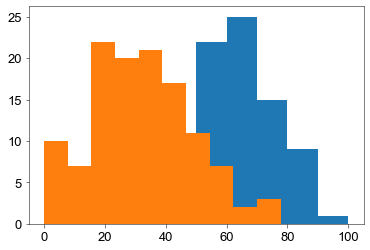

In [540]:
plt.hist(burglary.perc)
plt.hist(burglary.random_perc)

In [534]:
robbery = final_testing(ds, precincts, training_start, training_finis, testing_start_, testing_finis_)














  0%|          | 0/24 [00:00<?, ?it/s]













  0%|          | 0/5 [00:00<?, ?it/s]













 20%|██        | 1/5 [00:03<00:12,  3.00s/it]













 40%|████      | 2/5 [00:05<00:08,  2.92s/it]













 60%|██████    | 3/5 [00:08<00:05,  2.76s/it]













 80%|████████  | 4/5 [00:10<00:02,  2.61s/it]













100%|██████████| 5/5 [00:12<00:00,  2.50s/it]













  4%|▍         | 1/24 [00:12<04:47, 12.49s/it]













  0%|          | 0/5 [00:00<?, ?it/s]













 20%|██        | 1/5 [00:02<00:11,  2.92s/it]













 40%|████      | 2/5 [00:06<00:09,  3.05s/it]













 60%|██████    | 3/5 [00:09<00:06,  3.12s/it]













 80%|████████  | 4/5 [00:12<00:03,  3.06s/it]













100%|██████████| 5/5 [00:15<00:00,  3.15s/it]













  8%|▊         | 2/24 [00:28<04:56, 13.48s/it]













  0%|          | 0/5 [00:00<?, ?it/s]













 20%|██        | 1/5 [00:03<00:12,  3.03s/it]













 40%|████    

  0%|          | 0/5 [00:00<?, ?it/s]













 20%|██        | 1/5 [00:02<00:08,  2.23s/it]













 40%|████      | 2/5 [00:04<00:06,  2.18s/it]













 60%|██████    | 3/5 [00:06<00:04,  2.21s/it]













 80%|████████  | 4/5 [00:09<00:02,  2.52s/it]













100%|██████████| 5/5 [00:12<00:00,  2.56s/it]













 88%|████████▊ | 21/24 [04:34<00:36, 12.20s/it]













  0%|          | 0/5 [00:00<?, ?it/s]













 20%|██        | 1/5 [00:02<00:09,  2.45s/it]













 40%|████      | 2/5 [00:04<00:06,  2.28s/it]













 60%|██████    | 3/5 [00:06<00:04,  2.15s/it]













 80%|████████  | 4/5 [00:08<00:02,  2.08s/it]













100%|██████████| 5/5 [00:10<00:00,  2.02s/it]













 92%|█████████▏| 22/24 [04:44<00:23, 11.57s/it]













  0%|          | 0/5 [00:00<?, ?it/s]













 20%|██        | 1/5 [00:02<00:09,  2.47s/it]













 40%|████      | 2/5 [00:04<00:07,  2.34s/it]













 60%|██████    | 

In [535]:
robbery

,precinct,prediction,observed,random_prediction,date
0,75,16,25,18,2017-01-01
1,43,2,16,5,2017-01-01
2,103,0,16,13,2017-01-01
3,67,16,21,8,2017-01-01
4,47,0,19,3,2017-01-01
...,...,...,...,...,...
115,75,9,28,15,2018-12-01
116,43,3,14,3,2018-12-01
117,103,5,13,4,2018-12-01
118,67,3,8,1,2018-12-01


In [537]:
robbery['perc'] = robbery['prediction'] / robbery['observed'] * 100
robbery['random_perc'] = robbery['random_prediction'] / robbery['observed'] * 100

In [538]:
robbery

,precinct,prediction,observed,random_prediction,date,perc,random_perc
0,75,16,25,18,2017-01-01,64.000000,72.000000
1,43,2,16,5,2017-01-01,12.500000,31.250000
2,103,0,16,13,2017-01-01,0.000000,81.250000
3,67,16,21,8,2017-01-01,76.190476,38.095238
4,47,0,19,3,2017-01-01,0.000000,15.789474
...,...,...,...,...,...,...,...
115,75,9,28,15,2018-12-01,32.142857,53.571429
116,43,3,14,3,2018-12-01,21.428571,21.428571
117,103,5,13,4,2018-12-01,38.461538,30.769231
118,67,3,8,1,2018-12-01,37.500000,12.500000


(array([10., 22., 16., 19., 15., 14., 13.,  4.,  6.,  1.]),
 array([ 0.        ,  9.09090909, 18.18181818, 27.27272727, 36.36363636,
        45.45454545, 54.54545455, 63.63636364, 72.72727273, 81.81818182,
        90.90909091]),
 <a list of 10 Patch objects>)

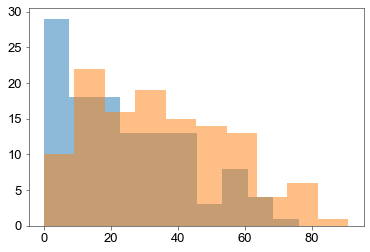

In [543]:
plt.hist(robbery.perc, alpha=.5)
plt.hist(robbery.random_perc, alpha=.5)